In [3]:
import warnings
warnings.filterwarnings('ignore')
import os, sys, random
from collections import Counter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from tqdm import tqdm, trange
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import (
    roc_auc_score, roc_curve, precision_recall_curve,
    average_precision_score, brier_score_loss
)
from sklearn.calibration import calibration_curve
from scipy import stats
def shannon_entropy(p, epsilon=1e-10):
    p = np.clip(p, epsilon, 1 - epsilon)
    return -p * np.log(p) - (1 - p) * np.log(1 - p)
def compute_ece(y_true, y_prob, n_bins=10):
    y_true, y_prob = np.array(y_true), np.array(y_prob)
    bin_edges = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        bin_lower = bin_edges[i]
        bin_upper = bin_edges[i + 1]
        bin_mask = (y_prob > bin_lower) & (y_prob <= bin_upper)
        if np.sum(bin_mask) > 0:
            bin_accuracy = np.mean(y_true[bin_mask] == 1)
            bin_confidence = np.mean(y_prob[bin_mask])
            ece += np.abs(bin_accuracy - bin_confidence) * (np.sum(bin_mask) / len(y_true))
    return ece
def uncertainty_auroc(y, predictions, variance):
    y = np.array(y)
    predictions = np.array(predictions)
    variance = np.array(variance)
    correctness = (y == (predictions > 0.5))
    fprs, tprs, _ = roc_curve(correctness, -variance)
    auc = roc_auc_score(correctness, -variance)
    return tprs, fprs, auc
def calculate_ause(uncertainty, predictions, targets, metric='brier',
                   bins=10, min_fraction=0.0, max_fraction=0.9,
                   ax=None, color='b', label='Sparsification Error'):
    if not (len(predictions) == len(targets) == len(uncertainty)):
        raise ValueError("predictions, targets, and uncertainty must have the same length.")
    if len(predictions) < 10:
        raise ValueError("Not enough predictions for sparsification.")
    def brier_score(preds, tgts):
        return np.mean((preds - tgts) ** 2)
    def mean_absolute_error(preds, tgts):
        return np.mean(np.abs(preds - tgts))
    def calculate_ece_metric(preds, tgts, n_bins=10):
        n = len(preds)
        if n == 0:
            return np.nan
        bin_edges = np.linspace(0., 1., n_bins + 1)
        bin_indices = np.digitize(preds, bin_edges, right=True) - 1
        ece_val = 0.0
        for i in range(n_bins):
            bin_mask = bin_indices == i
            bin_size = np.sum(bin_mask)
            if bin_size > 0:
                bin_conf = np.mean(preds[bin_mask])
                bin_acc = np.mean(tgts[bin_mask])
                ece_val += (bin_size / n) * np.abs(bin_acc - bin_conf)
        return ece_val
    def calculate_auc_metric(preds, tgts):
        if len(np.unique(tgts)) < 2:
            return np.nan
        return roc_auc_score(tgts, preds)
    if metric == 'brier':
        error_fn = brier_score
    elif metric == 'mae':
        error_fn = mean_absolute_error
    elif metric == 'ece':
        error_fn = lambda p, t: calculate_ece_metric(p, t, n_bins=bins)
    elif metric == 'auc':
        error_fn = calculate_auc_metric
    else:
        raise ValueError("Unknown metric. Choose from 'brier', 'mae', 'ece', or 'auc'.")
    sorted_inds = np.argsort(uncertainty)
    if metric in ['brier', 'mae']:
        true_errors = (predictions - targets) ** 2 if metric=='brier' else np.abs(predictions - targets)
        sorted_error_inds = np.argsort(true_errors)
    else:
        sorted_error_inds = None
    uncertainty_scores = []
    oracle_scores = []
    fractions = np.linspace(min_fraction, max_fraction, int((max_fraction - min_fraction)/0.01) + 1)
    num_samples = len(predictions)
    for fraction in fractions:
        num_keep = max(1, int((1.0 - fraction) * num_samples))
        inds_keep = sorted_inds[:num_keep]
        try:
            unc_score = error_fn(predictions[inds_keep], targets[inds_keep])
        except Exception as e:
            print(f"Error at fraction {fraction:.2f}: {e}")
            unc_score = np.nan
        uncertainty_scores.append(unc_score)
        if sorted_error_inds is not None:
            inds_oracle = sorted_error_inds[:num_keep]
            try:
                oracle_score = error_fn(predictions[inds_oracle], targets[inds_oracle])
            except Exception as e:
                print(f"Oracle error at fraction {fraction:.2f}: {e}")
                oracle_score = np.nan
            oracle_scores.append(oracle_score)
        else:
            oracle_scores.append(np.nan)
    uncertainty_scores = np.array(uncertainty_scores)
    if metric in ['brier', 'mae', 'ece']:
        norm_scores = uncertainty_scores / uncertainty_scores[0]
    elif metric == 'auc':
        norm_scores = (1 - uncertainty_scores) / (1 - uncertainty_scores[0])
    else:
        norm_scores = uncertainty_scores
    ause = np.trapz(norm_scores, fractions) / (max_fraction - min_fraction)
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(fractions, norm_scores, label=f"{label} (AUSE={ause:.4f})", color=color)
    ax.set_xlabel("Fraction Removed")
    ax.set_ylabel(f"{metric.upper()} Error (Normalized)")
    ax.set_ylim([0, 1.5])
    ax.set_title("Sparsification Curve")
    ax.legend()
    ax.grid(True)
    plt.tight_layout()
    return ause
def model_result_show(prob_df_set, y, n, df_names, truncations, truncation_colors, metric='brier'):
    y = np.array(y).ravel()
    n = np.array(n).ravel()
    num_poolings = len(prob_df_set)
    fig, axes = plt.subplots(num_poolings, 10, figsize=(60, 6 * num_poolings))
    if num_poolings == 1:
        axes = np.array([axes])
    records = []
    for i in range(num_poolings):
        pooling_name = df_names[i]
        df_full = np.array(prob_df_set[i])
        ax_var_density        = axes[i][0]
        ax_unc_roc            = axes[i][1]
        ax_calibration        = axes[i][2]
        ax_normal_roc         = axes[i][3]
        ax_sparsification     = axes[i][4]
        ax_brier_density      = axes[i][5]
        ax_entropy_density    = axes[i][6]
        ax_nll_density        = axes[i][7]
        ax_pred_prob_density  = axes[i][8]
        ax_pr                 = axes[i][9]
        for t_idx, t_val in enumerate(truncations):
            if t_idx == 0:
                mask = (n <= t_val)
            else:
                mask = (n > truncations[t_idx-1]) & (n <= t_val)
            if not np.any(mask):
                continue
            sub_df = df_full[mask]
            sub_y  = y[mask]
            fraction = sub_df.shape[0] / df_full.shape[0]
            predictions = np.mean(sub_df, axis=1)
            variance = np.var(sub_df, axis=1)
            normal_fpr, normal_tpr, _ = roc_curve(sub_y, predictions)
            normal_auc = roc_auc_score(sub_y, predictions)
            unc_tpr, unc_fpr, unc_auc = uncertainty_auroc(sub_y, predictions, variance)
            prob_true, prob_pred = calibration_curve(sub_y, predictions, n_bins=10)
            ece_val = compute_ece(sub_y, predictions)
            precision, recall, _ = precision_recall_curve(sub_y, predictions)
            auprc = average_precision_score(sub_y, predictions)
            brier = (sub_y - predictions) ** 2
            epsilon = 1e-10
            nll = -sub_y * np.log(predictions + epsilon) - (1 - sub_y) * np.log(1 - predictions + epsilon)
            entropy_val = shannon_entropy(predictions)
            ause = calculate_ause(variance, predictions, sub_y, metric=metric,
                                  min_fraction=0.0, max_fraction=0.9, ax=ax_sparsification,
                                  color=truncation_colors[t_idx], label=f"{t_val}")
            record = {
                "pooling": pooling_name,
                "truncation": f"{t_val}",
                "ratio": fraction,
                "AUROC": normal_auc,
                "uncertainty_AUROC": unc_auc,
                "Ece": ece_val,
                "Entropy": np.mean(entropy_val),
                "Nll": np.mean(nll),
                "Variance": np.mean(variance)
            }
            records.append(record)
            c = truncation_colors[t_idx]
            sns.kdeplot(variance, ax=ax_var_density,
                        label=f"{record['truncation']}  ratio={fraction:.2f})",
                        fill=False, color=c)
            ax_unc_roc.plot(unc_fpr, unc_tpr,
                            label=f"{record['truncation']} (AUROC={unc_auc:.2f}, ratio={fraction:.2f})",
                            color=c)
            ax_calibration.plot(prob_pred, prob_true, marker="o",
                                label=f"{record['truncation']} (ECE={ece_val:.2f}, ratio={fraction:.2f})",
                                color=c)
            ax_normal_roc.plot(normal_fpr, normal_tpr,
                               label=f"{record['truncation']} (AUC={normal_auc:.2f}, ratio={fraction:.2f})",
                               color=c)
            sns.kdeplot(brier, ax=ax_brier_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        color=c)
            sns.kdeplot(entropy_val, ax=ax_entropy_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        color=c)
            sns.kdeplot(nll, ax=ax_nll_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        color=c)
            sns.kdeplot(predictions, ax=ax_pred_prob_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        color=c)
            ax_pr.plot(recall, precision, marker='.',
                       label=f"{record['truncation']} (AUPRC={auprc:.2f}, ratio={fraction:.2f})",
                       color=c)
        ax_var_density.set_title(f"{pooling_name} - Variance Density")
        ax_var_density.set_xlabel("Variance")
        ax_var_density.legend()
        ax_unc_roc.set_title(f"{pooling_name} - Uncertainty ROC")
        ax_unc_roc.set_xlabel("False Positive Rate")
        ax_unc_roc.set_ylabel("True Positive Rate")
        ax_unc_roc.plot([0,1],[0,1],'--', color='gray')
        ax_unc_roc.legend()
        ax_unc_roc.grid(True)
        ax_calibration.set_title(f"{pooling_name} - Calibration Curve")
        ax_calibration.set_xlabel("Mean Predicted Probability")
        ax_calibration.set_ylabel("Actual Positive Proportion")
        ax_calibration.plot([0,1],[0,1],'--', color='gray')
        ax_calibration.legend()
        ax_normal_roc.set_title(f"{pooling_name} - ROC Curve")
        ax_normal_roc.set_xlabel("False Positive Rate")
        ax_normal_roc.set_ylabel("True Positive Rate")
        ax_normal_roc.plot([0,1],[0,1],'--', color='gray')
        ax_normal_roc.legend()
        ax_normal_roc.grid(True)
        ax_sparsification.set_title(f"{pooling_name} - Sparsification Curve (Metric: {metric.upper()})")
        ax_sparsification.set_ylim([-0.01, 1.05])
        ax_sparsification.legend()
        ax_sparsification.grid(True)
        ax_brier_density.set_title(f"{pooling_name} - Brier Score Density")
        ax_brier_density.set_xlabel("Brier Score")
        ax_brier_density.set_ylabel("Density")
        ax_brier_density.legend()
        ax_entropy_density.set_title(f"{pooling_name} - Prediction Entropy Density")
        ax_entropy_density.set_xlabel("Entropy")
        ax_entropy_density.set_ylabel("Density")
        ax_entropy_density.legend()
        ax_nll_density.set_title(f"{pooling_name} - NLL Density")
        ax_nll_density.set_xlabel("NLL")
        ax_nll_density.set_ylabel("Density")
        ax_nll_density.legend()
        ax_pred_prob_density.set_title(f"{pooling_name} - Predicted Probability Density")
        ax_pred_prob_density.set_xlabel("Predicted Probability")
        ax_pred_prob_density.set_ylabel("Density")
        ax_pred_prob_density.legend()
        ax_pr.set_title(f"{pooling_name} - Precision-Recall Curve")
        ax_pr.set_xlabel("Recall")
        ax_pr.set_ylabel("Precision")
        ax_pr.set_xlim([0.0,1.0])
        ax_pr.set_ylim([0.0,1.05])
        ax_pr.legend()
        ax_pr.grid(True)
    plt.tight_layout()
    plt.show()
    return pd.DataFrame(records)
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
def plot_sequence_length_histogram(train_lengths, val_lengths, title, bins=50):
    plt.figure(figsize=(10,6))
    plt.hist(train_lengths, bins=bins, edgecolor='black', alpha=0.7, label='Train')
    plt.hist(val_lengths, bins=bins, edgecolor='black', alpha=0.7, label='Validation')
    plt.title(title)
    plt.xlabel('Sequence Length')
    plt.ylabel('Count')
    plt.legend()
    plt.show()
def plot_aggregated_metrics(df, x_label="Sequence Length",path=None):
    ratio_dict = df.groupby('truncation')['ratio'].first().to_dict()
    metrics = df.columns.to_list()[3:]
    df_melted = df.melt(id_vars=['pooling', 'truncation'], value_vars=metrics,
                        var_name='metric', value_name='value')
    sns.set(style="whitegrid", font_scale=1.2)
    unique_metrics = df_melted['metric'].unique()
    unique_poolings = df_melted['pooling'].unique()
    palette = sns.color_palette("tab10", n_colors=len(unique_poolings))
    color_dict = dict(zip(unique_poolings, palette))
    num_metrics = len(unique_metrics)
    num_cols = 3
    num_rows = int(np.ceil(num_metrics / num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
    axes = axes.flatten()
    for idx, metric in enumerate(unique_metrics):
        ax = axes[idx]
        data_metric = df_melted[df_melted['metric'] == metric]
        for pooling in unique_poolings:
            data_pooling = data_metric[data_metric['pooling'] == pooling]
            sns.lineplot(data=data_pooling, x='truncation', y='value',
                         marker='o', label=pooling, color=color_dict[pooling],
                         ax=ax, linewidth=2)
        ax.set_title(metric.replace('_', ' ').title())
        ax.set_xlabel(x_label)
        ax.set_ylabel('Value')
        ax.legend()
        current_ticklabels = ax.get_xticklabels()
        new_labels = []
        for lbl in current_ticklabels:
            text = lbl.get_text()
            if text in ratio_dict:
                new_labels.append(f"{text}\n({ratio_dict[text]:.2f})")
            else:
                new_labels.append(text)
        ax.set_xticklabels(new_labels)
    for j in range(len(unique_metrics), len(axes)):
        fig.delaxes(axes[j])
    plt.tight_layout()
    if path:
        plt.savefig(path, bbox_inches='tight', dpi=300)
    plt.show()
def augment_sentence(sentence, tokenizer, levels):
    tokens = tokenizer.tokenize(sentence)
    L = len(tokens)
    if L == 0:
        return sentence, None
    level = random.choice(levels)
    window_length = max(1, int(round(level * L)))
    if window_length >= L:
        return sentence, level
    start_idx = random.randint(0, L - window_length)
    truncated_tokens = tokens[start_idx:start_idx + window_length]
    augmented_sentence = tokenizer.convert_tokens_to_string(truncated_tokens)
    return augmented_sentence, level
def filter_and_augment(sentences, labels, tokenizer, lower_bound, upper_bound, levels):
    augmented_sentences = []
    augmented_labels = []
    truncation_levels_record = []
    for sent, lbl in zip(sentences, labels):
        tokens = tokenizer.tokenize(sent)
        L = len(tokens)
        if lower_bound <= L <= upper_bound:
            aug_sent, level = augment_sentence(sent, tokenizer, levels)
            augmented_sentences.append(aug_sent)
            augmented_labels.append(lbl)
            truncation_levels_record.append(level)
    return augmented_sentences, augmented_labels, truncation_levels_record
def imdb_processing():
    with open("IMDB/train.pkl", 'rb') as f:
        s_train, y_train = pickle.load(f)
    with open("IMDB/test.pkl", 'rb') as f:
        s_val, y_val = pickle.load(f)
    tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased", do_lower_case=True)
    encodings = tokenizer(s_train, add_special_tokens=True, padding=False, truncation=False)
    lengths = [len(seq) for seq in encodings["input_ids"]]
    plt.figure(figsize=(10,6))
    plt.hist(lengths, bins=50, edgecolor='black', alpha=0.7, label='Train')
    plt.title('Balanced Distribution of Sequence Lengths (IMDB)')
    plt.xlabel('Sequence Length')
    plt.ylabel('Count')
    plt.legend()
    plt.show()
    length_counter = Counter(lengths)
    most_common_length, count_most_common = length_counter.most_common(1)[0]
    print(f"Most common sequence length: {most_common_length} (appeared {count_most_common} times)")
    desired_fraction = 0.4
    delta = 0
    total_samples = len(lengths)
    while True:
        lower_bound_candidate = most_common_length - delta
        upper_bound_candidate = most_common_length + delta
        count_in_window = sum(1 for l in lengths if lower_bound_candidate <= l <= upper_bound_candidate)
        fraction = count_in_window / total_samples
        if fraction >= desired_fraction:
            break
        delta += 1
    target_lower = most_common_length - delta
    target_upper = most_common_length + delta
    print(f"Selected window: [{target_lower}, {target_upper}] tokens (delta = {delta}), fraction: {fraction:.2%}")
    trunc_levels = [0.2, 0.4, 0.6, 0.8,1]
    s_train_aug, y_train_aug, train_trunc_levels = filter_and_augment(s_train, y_train, tokenizer, target_lower, target_upper, trunc_levels)
    s_val_aug, y_val_aug, val_trunc_levels = filter_and_augment(s_val, y_val, tokenizer, target_lower, target_upper, trunc_levels)
    print("Augmented train samples:", len(s_train_aug))
    print("Augmented validation samples:", len(s_val_aug))
    def print_label_ratio(labels, name):
        cnt = Counter(labels)
        total = sum(cnt.values())
        print(f"\n{name} total samples: {total}")
        for label, count in cnt.items():
            print(f"{label}: {count} ({count/total:.2%})")
    print_label_ratio(y_train_aug, "Train")
    print_label_ratio(y_val_aug, "Validation")
    dc = {"pos": 1, "neg": 0}
    y_train_int = [dc[label] for label in y_train_aug]
    y_val_int = [dc[label] for label in y_val_aug]
    seq_l = 230
    poolings = ["cls", "mean_without_padding"]
    res_set = []
    for pooling in poolings:
        try:
            with open(f'IMDB/model/ntrain_{pooling}_sq{seq_l}_imdb_bal.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    truncation_colors = sns.color_palette("tab10", n_colors=len(trunc_levels)+1)
    data = model_result_show(res_set, np.array(y_val_int), np.array(val_trunc_levels),
                             poolings, trunc_levels, truncation_colors, metric='brier')
    plot_aggregated_metrics(data, x_label="Information retained ratio(%)",path="trun_imdb.png")
    return data, y_val_int
def read_pubmed_rct(url):
    labels = []
    sentences = []
    import requests
    with requests.get(url) as r:
        for line in r.iter_lines():
            fields = line.decode('utf-8').strip().split('\t')
            if len(fields) == 2:
                lbl, sent = fields[0], fields[1]
                if lbl in ["BACKGROUND", "OBJECTIVE"]:
                    labels.append(lbl)
                    sentences.append(sent)
    return sentences, labels
def rct_processing():
    import requests
    seed = 42
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    train_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/train.txt?raw=true'
    val_url   = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/dev.txt?raw=true'
    s_train, y_train = read_pubmed_rct(train_url)
    s_val, y_val = read_pubmed_rct(val_url)
    tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")
    encodings_train = tokenizer(s_train, add_special_tokens=True, padding=False, truncation=False)
    train_lengths = [len(seq) for seq in encodings_train["input_ids"]]
    plt.figure(figsize=(10,6))
    plt.hist(train_lengths, bins=50, edgecolor='black')
    plt.title('Distribution of Sequence Lengths - RCT Training Set')
    plt.xlabel('Sequence Length')
    plt.ylabel('Count')
    plt.show()
    length_counter = Counter(train_lengths)
    most_common_length, count = length_counter.most_common(1)[0]
    print(f"Most common sequence length: {most_common_length} (appeared {count} times)")
    desired_fraction = 0.4
    delta = 0
    total_samples = len(train_lengths)
    while True:
        lower_bound_candidate = most_common_length - delta
        upper_bound_candidate = most_common_length + delta
        count_in_window = sum(1 for l in train_lengths if lower_bound_candidate <= l <= upper_bound_candidate)
        fraction = count_in_window / total_samples
        if fraction >= desired_fraction:
            break
        delta += 1
    target_lower = most_common_length - delta
    target_upper = most_common_length + delta
    print(f"Selected window: [{target_lower}, {target_upper}] tokens (delta = {delta}), fraction: {fraction:.2%}")
    trunc_levels = [0.2, 0.4, 0.6, 0.8,1]
    s_train_aug, y_train_aug, train_trunc_levels = filter_and_augment(s_train, y_train, tokenizer, target_lower, target_upper, trunc_levels)
    s_val_aug, y_val_aug, val_trunc_levels = filter_and_augment(s_val, y_val, tokenizer, target_lower, target_upper, trunc_levels)
    print("Augmented train samples:", len(s_train_aug))
    print("Augmented validation samples:", len(s_val_aug))
    def print_label_ratio(labels, name):
        cnt = Counter(labels)
        total = sum(cnt.values())
        print(f"\n{name} total samples: {total}")
        for label, count in cnt.items():
            print(f"{label}: {count} ({count/total:.2%})")
    print_label_ratio(y_train_aug, "Train")
    print_label_ratio(y_val_aug, "Validation")
    label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
    y_train_int = [label_map[label] for label in y_train_aug]
    y_val_int = [label_map[label] for label in y_val_aug]
    seq_l = 34
    poolings = ["cls", "mean_without_padding"]
    res_set = []
    for pooling in poolings:
        try:
            with open(f'model/ntrain_{pooling}_sq{seq_l}_rct_bal.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    truncation_colors = sns.color_palette("tab10", n_colors=len(trunc_levels))
    data = model_result_show(res_set, np.array(y_val_int), np.array(val_trunc_levels),
                             poolings, trunc_levels, truncation_colors, metric='brier')
    plot_aggregated_metrics(data, x_label="Information retained ratio(%)",path="trun_rct.png")
    return data, y_val_int,val_trunc_levels
def yelp_processing():
    from datasets import load_dataset
    seed = 42
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    dataset = load_dataset("yelp_review_full")
    def filter_reviews(example):
        return example['label'] in [0, 4]
    train_ds = dataset['train'].filter(filter_reviews)
    test_ds  = dataset['test'].filter(filter_reviews)
    label_map = {0: 0, 4: 1}
    train_ds = train_ds.map(lambda x: {'label': label_map[x['label']]})
    test_ds  = test_ds.map(lambda x: {'label': label_map[x['label']]})
    s_train = train_ds['text']
    y_train = train_ds['label']
    s_test  = test_ds['text']
    y_test  = test_ds['label']
    train_sample_size = 50000
    test_sample_size  = 10000
    s_train, y_train = s_train[:train_sample_size], y_train[:train_sample_size]
    s_test, y_test   = s_test[:test_sample_size], y_test[:test_sample_size]
    s_val, y_val = s_test, y_test
    tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")
    encodings_train = tokenizer(s_train, add_special_tokens=True, padding=False, truncation=False)
    train_lengths = [len(seq) for seq in encodings_train["input_ids"]]
    plt.figure(figsize=(10,6))
    plt.hist(train_lengths, bins=50, edgecolor='black')
    plt.title("Distribution of Sequence Lengths (with special tokens) - Yelp Train Set")
    plt.xlabel("Sequence Length")
    plt.ylabel("Count")
    plt.show()
    length_counter = Counter(train_lengths)
    most_common_length, count_common = length_counter.most_common(1)[0]
    print(f"Most common sequence length: {most_common_length} (appeared {count_common} times)")
    desired_fraction = 0.4
    delta = 0
    total_samples = len(train_lengths)
    while True:
        lower_bound_candidate = most_common_length - delta
        upper_bound_candidate = most_common_length + delta
        count_in_window = sum(1 for l in train_lengths if lower_bound_candidate <= l <= upper_bound_candidate)
        fraction = count_in_window / total_samples
        if fraction >= desired_fraction:
            break
        delta += 1
    target_lower = most_common_length - delta
    target_upper = most_common_length + delta
    print(f"Selected window: [{target_lower}, {target_upper}] tokens (delta = {delta}), fraction: {fraction:.2%}")
    trunc_levels = [0.2, 0.4, 0.6, 0.8,1]
    s_train_aug, y_train_aug, train_trunc_levels = filter_and_augment(s_train, y_train, tokenizer, target_lower, target_upper, trunc_levels)
    s_val_aug, y_val_aug, val_trunc_levels = filter_and_augment(s_test, y_test, tokenizer, target_lower, target_upper, trunc_levels)
    print("Augmented train samples:", len(s_train_aug))
    print("Augmented validation samples:", len(s_val_aug))
    def print_label_ratio(labels, name):
        cnt = Counter(labels)
        total = sum(cnt.values())
        print(f"\n{name} total samples: {total}")
        for label, count in cnt.items():
            print(f"{label}: {count} ({count/total:.2%})")
    print_label_ratio(y_train_aug, "Train")
    print_label_ratio(y_val_aug, "Validation")
    seq_l = 95
    poolings = ["cls", "mean_without_padding"]
    res_set = []
    for pooling in poolings:
        try:
            with open(f'Yelp/model/ntrain_{pooling}_sq{seq_l}_yelp_bal.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    truncation_colors = sns.color_palette("tab10", n_colors=len(trunc_levels))
    data = model_result_show(res_set, np.array(y_val_aug), np.array(val_trunc_levels),
                             poolings, trunc_levels, truncation_colors, metric='brier')
    plot_aggregated_metrics(data, x_label="Information retained ratio(%)",path="trun_Yelp.png")
    return data, y_val_aug,val_trunc_levels
def mimic3_processing():
    sys.path.append(os.path.abspath("mimic3"))
    from dataloader_trun import EHRDataset
    from utils import create_tokenizer
    warnings.filterwarnings('ignore')
    %load_ext autoreload
    %autoreload 2
    create_tokenizer(path_documents="mimic3/events.json")
    train_ds = EHRDataset(path_documents="mimic3/events.json",
                         path_labels="mimic3/targets.json",
                         path_tokenizer="mimic3/tokenizer.json",
                         mode="train",sequence_length=100,
                           truncation=[0.2,0.4,0.6,0.8,1],
                           random_seed=3)
    test_ds = EHRDataset(path_documents="mimic3/events.json",
                         path_labels="mimic3/targets.json",
                         path_tokenizer="mimic3/tokenizer.json",
                         mode="test",sequence_length=100,
                          truncation=[0.2,0.4,0.6,0.8,1],
                          random_seed=3)
    train_lengths = [sample['seq_l'] for sample in train_ds]
    test_lengths = [sample['seq_l'] for sample in test_ds]
    plt.figure(figsize=(12,6))
    plt.hist(train_lengths, bins=20, alpha=0.7, label='Train', edgecolor='black')
    plt.hist(test_lengths, bins=20, alpha=0.7, label='Test', edgecolor='black')
    plt.title("Sequence Length Distribution (MIMIC3)")
    plt.xlabel("Sequence Length")
    plt.ylabel("Count")
    plt.legend()
    plt.show()
    sys.path.remove(os.path.abspath("mimic3"))
    seq_l = 100
    poolings = ["cls", "mean_without_padding"]
    res_set = []
    for pooling in poolings:
        try:
            with open(f'mimic3/model_result/ensemble_{pooling}_sql{seq_l}_trun.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    print(res_set[0].shape)
    y_val_int = np.array([sample["target"] for sample in test_ds])
    print(len(y_val_int))
    sql = [sample["seq_l"]/100 for sample in test_ds]
    print(len(sql))
    truncs_interval = [0.2, 0.4, 0.6, 0.8,1]
    data = model_result_show(res_set, y_val_int, sql, poolings,
                             truncs_interval, sns.color_palette("tab10", n_colors=len(truncs_interval)+1), metric='brier')
    plot_aggregated_metrics(data, x_label="Information retained ratio(%)",path="trun_mimic.png")
    return data, y_val_int
def wafer_processing():
    sys.path.append(os.path.abspath("Time_series"))
    from dataset_wafer_trun import WaferDataset
    train_wafer = WaferDataset(root_dir="Time_series/data", mode="train",truncation=[0.2, 0.4, 0.6, 0.8,1],random_seed=0)
    test_wafer = WaferDataset(root_dir="Time_series/data", mode="test",truncation=[0.2, 0.4, 0.6, 0.8,1],random_seed=0)
    wafer_lengths = [round(sample["sql"]/152,2) for sample in test_wafer]
    plt.figure(figsize=(10,6))
    plt.hist(wafer_lengths, bins=50, edgecolor='black', alpha=0.7)
    plt.title("Sequence Length Distribution (Wafer)")
    plt.xlabel("Sequence Length")
    plt.ylabel("Count")
    plt.show()
    poolings = ["cls", "mean_without_padding"]
    seq_l = 152
    res_set = []
    for pooling in poolings:
        try:
            with open(f'Time_series/results/Wafer_ensemble_{pooling}_trun.pkl', 'rb') as f:
                res_set.append(pd.DataFrame(pickle.load(f)).T)
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    y_val_int = np.array([sample["target"] for sample in test_wafer])
    balanced_lengths = [round(sample["sql"]/152,2) for sample in test_wafer]
    truncs_interval = [0.2,0.4,0.6,0.8,1]
    data = model_result_show(res_set, y_val_int, balanced_lengths, poolings,
                             truncs_interval, sns.color_palette("tab10", n_colors=len(truncs_interval)), metric='brier')
    plot_aggregated_metrics(data, x_label="Information retained ratio(%)",path="trun_Wafer.png")
    sys.path.remove(os.path.abspath("Time_series"))
    return data, y_val_int
def ecg_processing():
    sys.path.append(os.path.abspath("Time_series"))
    from dataset_ecg200_trun import ECG200Dataset
    poolings = ["cls", "mean_without_padding"]
    seq_l = 140
    res_set = []
    for pooling in poolings:
        try:
            with open(f'Time_series/results/ECG200_ensemble_{pooling}_trun.pkl', 'rb') as f:
                res_set.append(pd.DataFrame(pickle.load(f)).T)
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    test_ecg = ECG200Dataset(root_dir="Time_series/data", mode="test",truncation=[0.2, 0.4, 0.6, 0.8,1],random_seed=1)
    balanced_lengths = [sample["sql"]/140 for sample in test_ecg]
    y_val_int = np.array([sample["target"] for sample in test_ecg])
    truncs_interval = [0.2,0.4,0.6,0.8,1]
    data = model_result_show(res_set, y_val_int, balanced_lengths, poolings,
                             truncs_interval, sns.color_palette("tab10", n_colors=len(truncs_interval)), metric='brier')
    plot_aggregated_metrics(data, x_label="Information retained ratio(%)",path="trun_ecg.png")
    sys.path.remove(os.path.abspath("Time_series"))
    return data, y_val_int,balanced_lengths
if __name__ == "__main__":
    pass


## IMDB

Token indices sequence length is longer than the specified maximum sequence length for this model (596 > 512). Running this sequence through the model will result in indexing errors


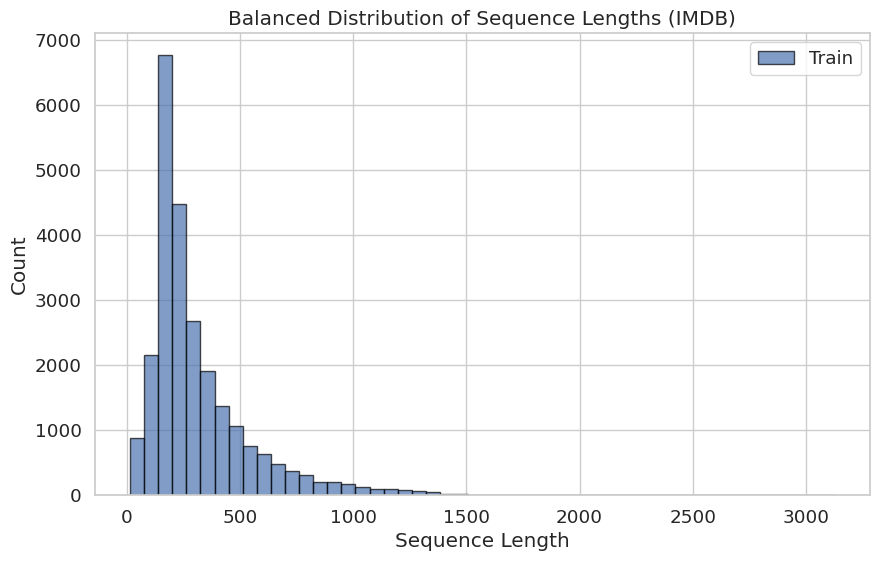

Most common sequence length: 174 (appeared 164 times)
Selected window: [118, 230] tokens (delta = 56), fraction: 40.13%
Augmented train samples: 10109
Augmented validation samples: 2028

Train total samples: 10109
pos: 4953 (49.00%)
neg: 5156 (51.00%)

Validation total samples: 2028
neg: 1046 (51.58%)
pos: 982 (48.42%)


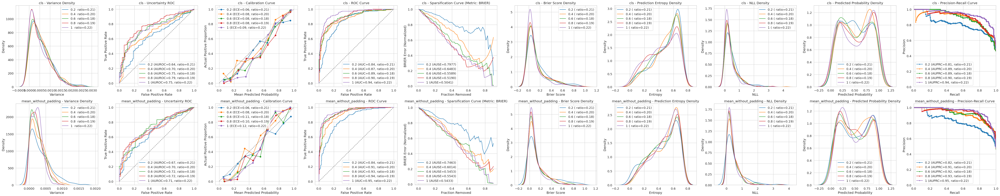

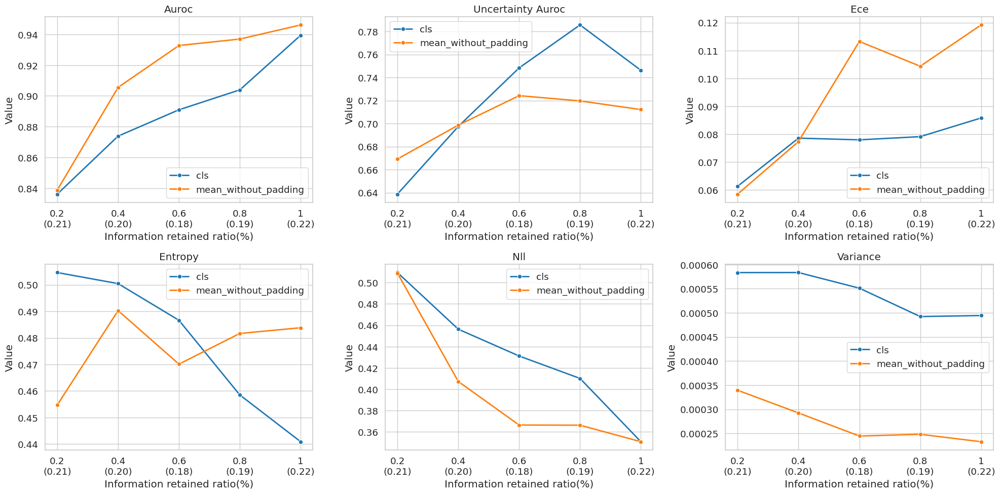

In [4]:
imdb_data,imdb_y =imdb_processing()


Token indices sequence length is longer than the specified maximum sequence length for this model (596 > 512). Running this sequence through the model will result in indexing errors


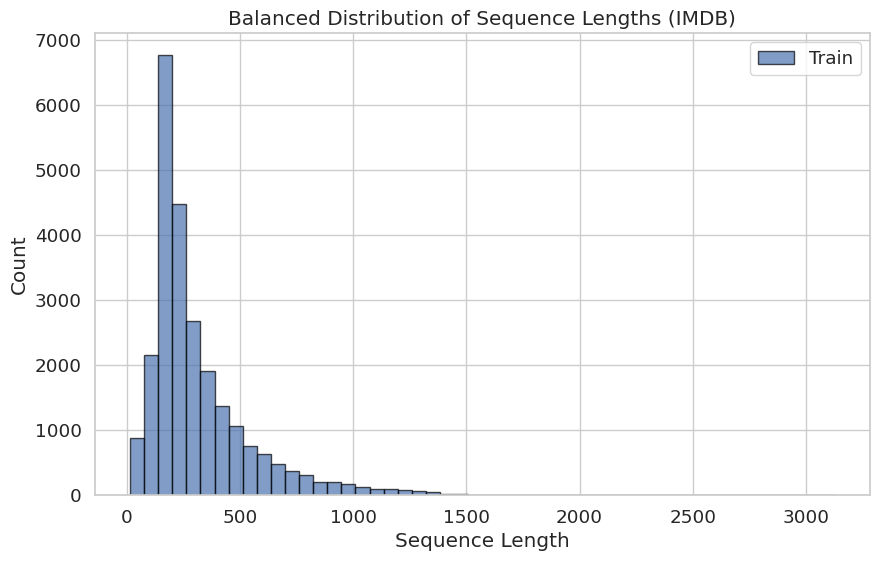

Most common sequence length: 174 (appeared 164 times)
Selected window: [118, 230] tokens (delta = 56), fraction: 40.13%
Augmented train samples: 10109
Augmented validation samples: 2028

Train total samples: 10109
pos: 4953 (49.00%)
neg: 5156 (51.00%)

Validation total samples: 2028
neg: 1046 (51.58%)
pos: 982 (48.42%)


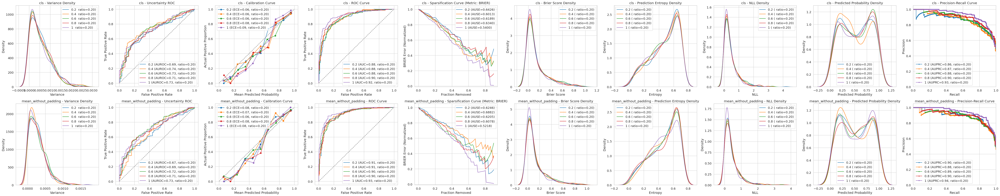

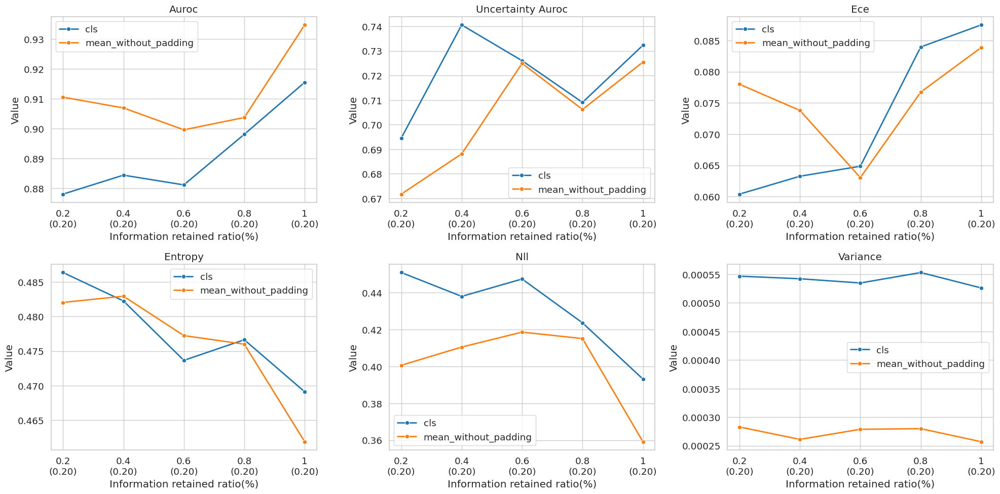

In [5]:
imdb_data,imdb_y =imdb_processing()


## RCT

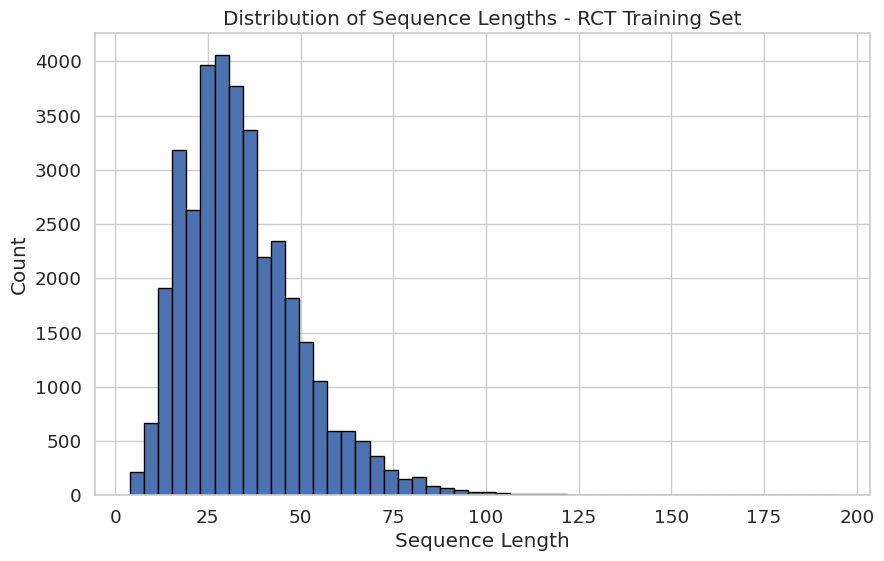

Most common sequence length: 27 (appeared 1057 times)
Selected window: [20, 34] tokens (delta = 7), fraction: 40.58%
Augmented train samples: 14440
Augmented validation samples: 2382

Train total samples: 14440
BACKGROUND: 8960 (62.05%)
OBJECTIVE: 5480 (37.95%)

Validation total samples: 2382
BACKGROUND: 1424 (59.78%)
OBJECTIVE: 958 (40.22%)


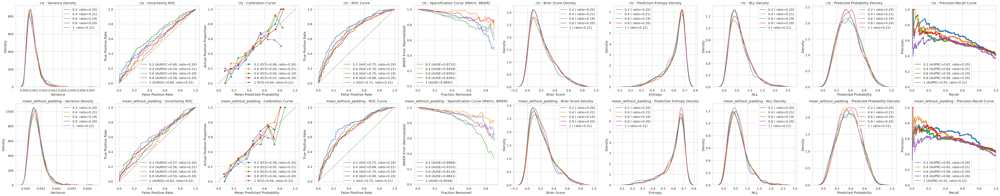

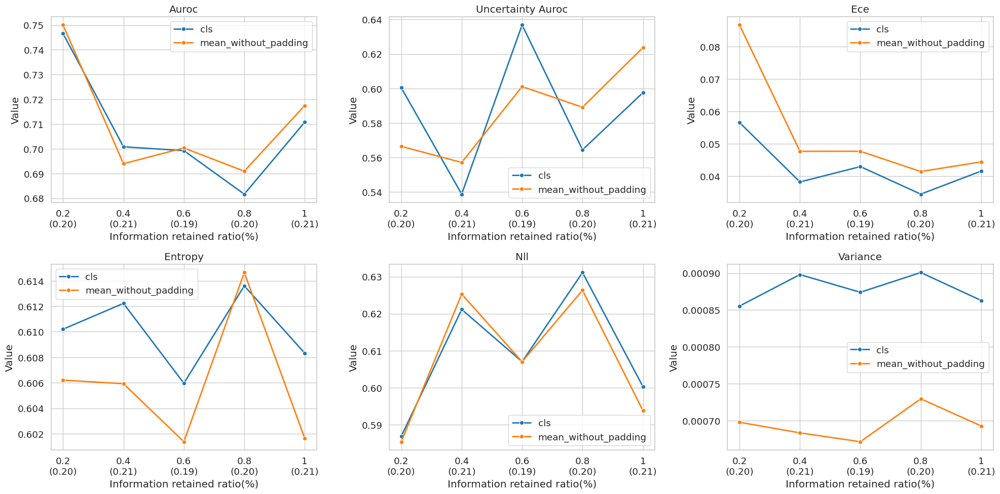

In [6]:
rct_data,rct_y ,TRUN  =rct_processing()


## Yelp

Token indices sequence length is longer than the specified maximum sequence length for this model (1019 > 512). Running this sequence through the model will result in indexing errors


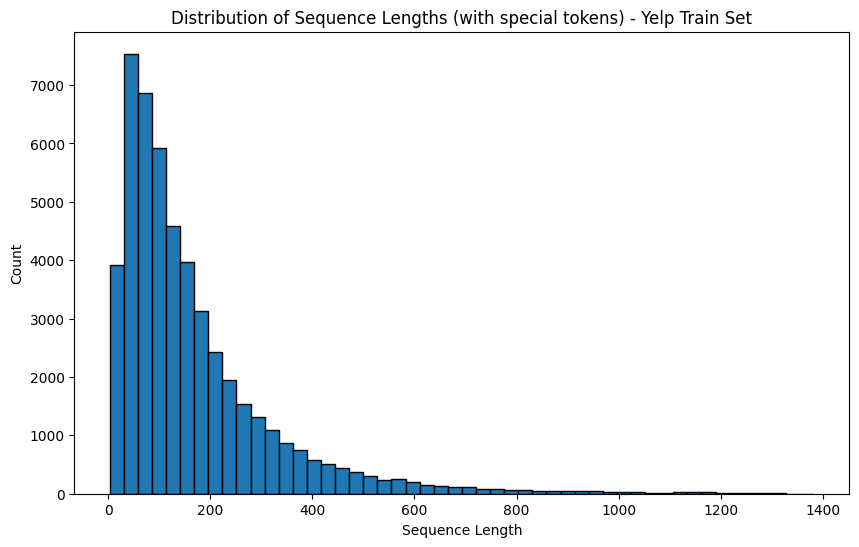

Most common sequence length: 52 (appeared 325 times)
Selected window: [9, 95] tokens (delta = 43), fraction: 40.32%
Augmented train samples: 20443
Augmented validation samples: 4000

Train total samples: 20443
1: 10969 (53.66%)
0: 9474 (46.34%)

Validation total samples: 4000
0: 1779 (44.47%)
1: 2221 (55.53%)


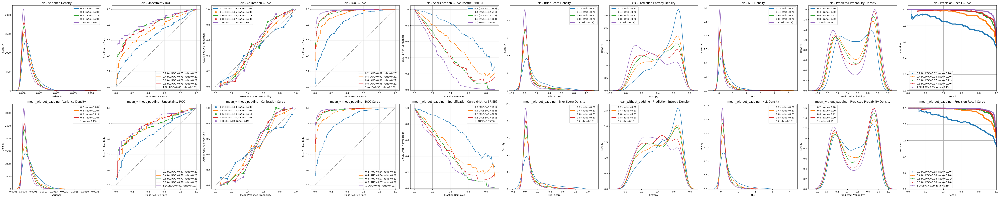

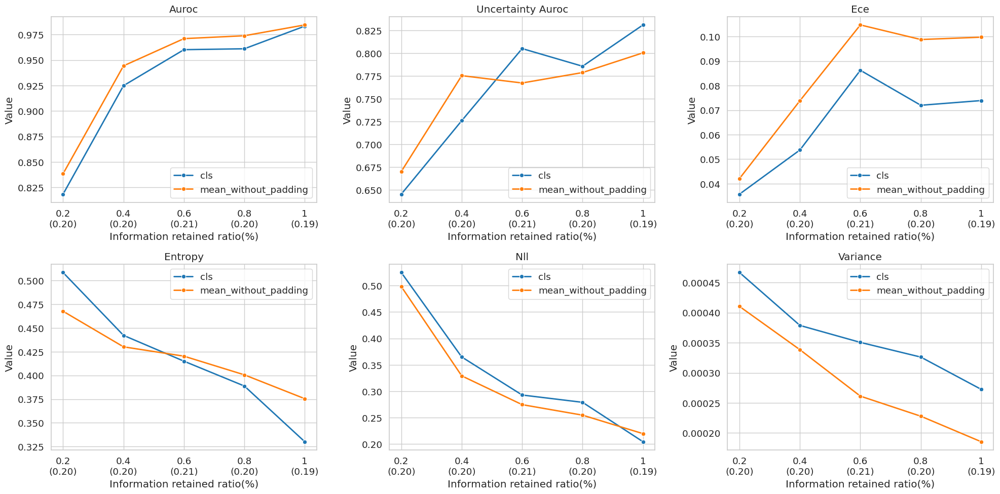

In [3]:
yelp_data,yelp_y,TRUN_Y=yelp_processing()


## MIMIC III

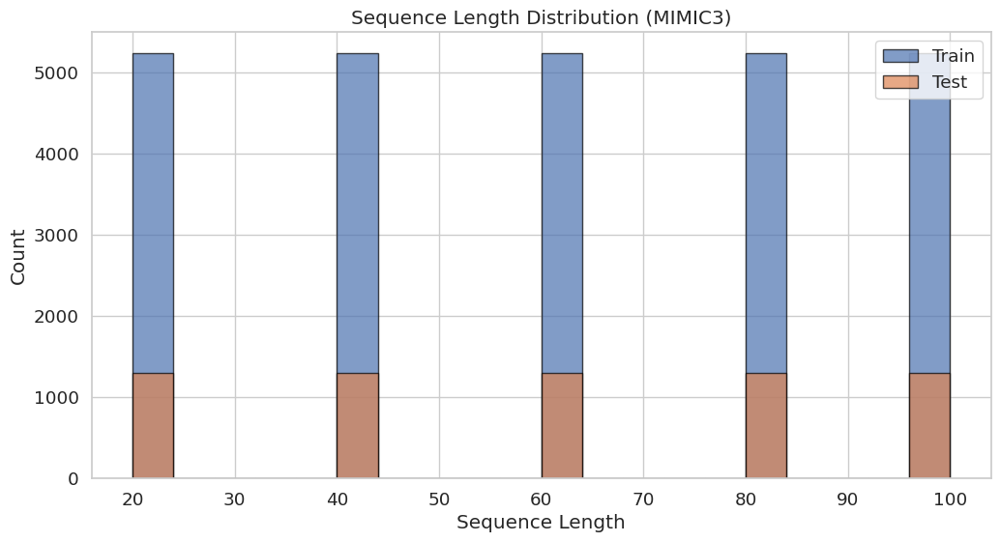

(6480, 10)
6480
6480


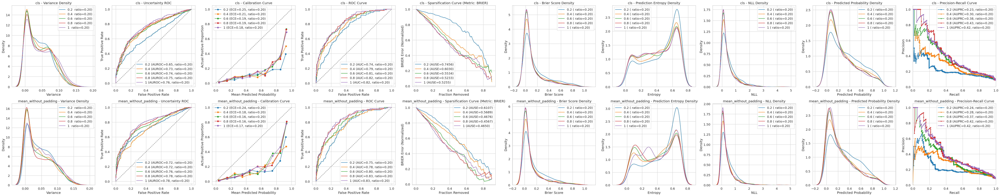

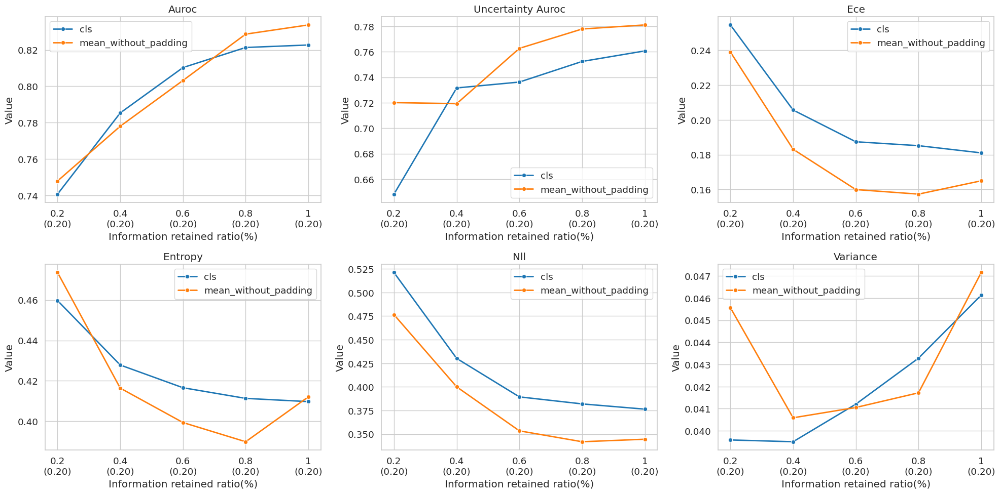

In [7]:
mimic3_data,mimic3_y=mimic3_processing()


## Wafer

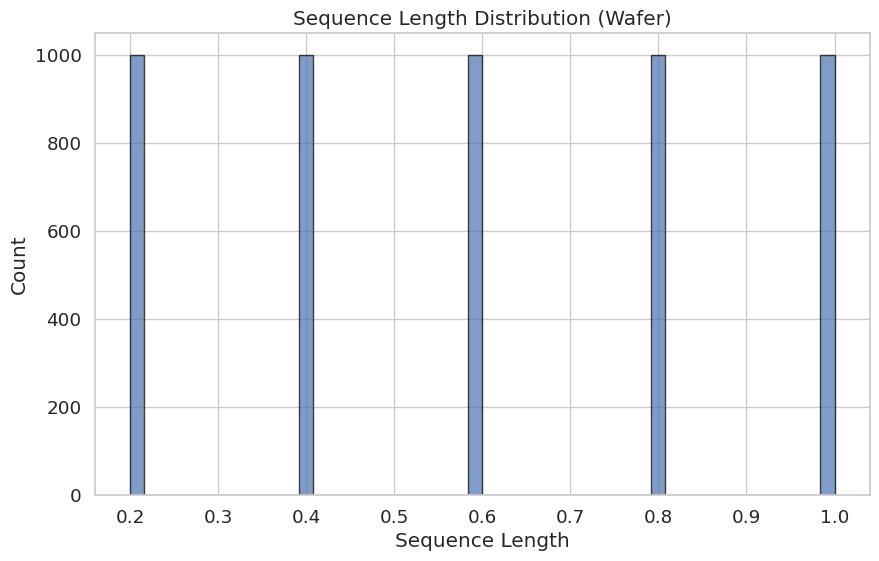

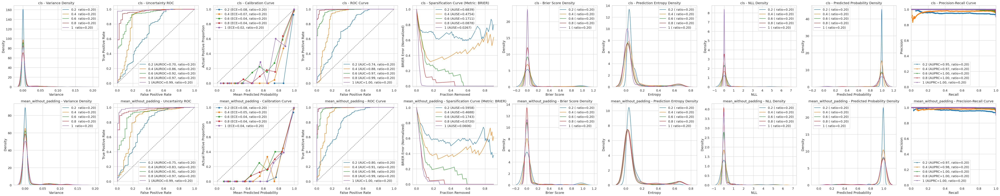

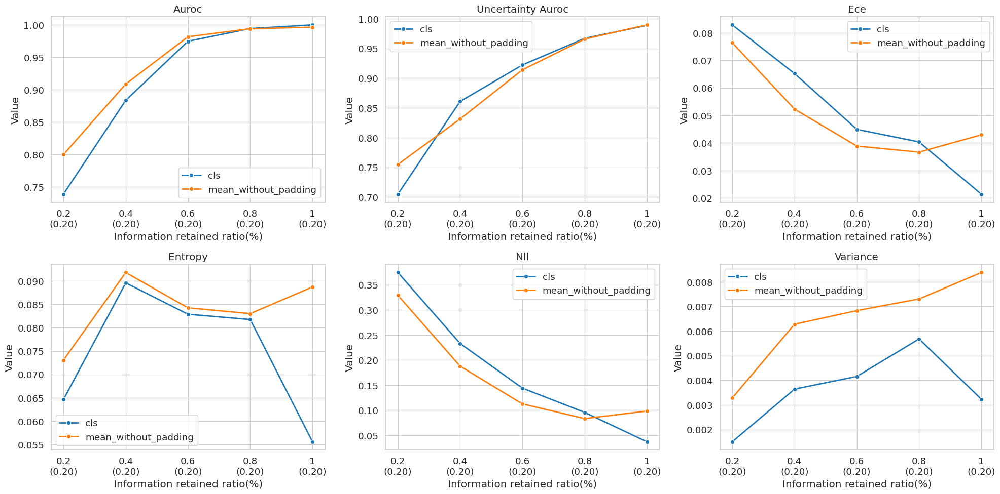

In [8]:
wafer_data,wafer_y=wafer_processing()


## ECG

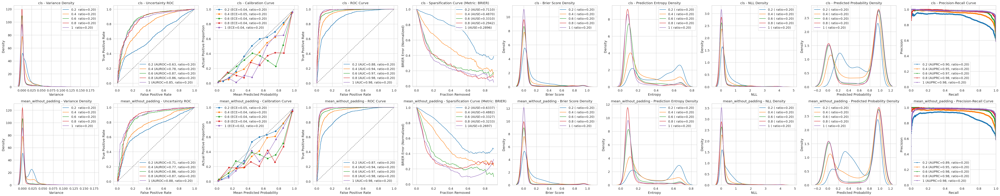

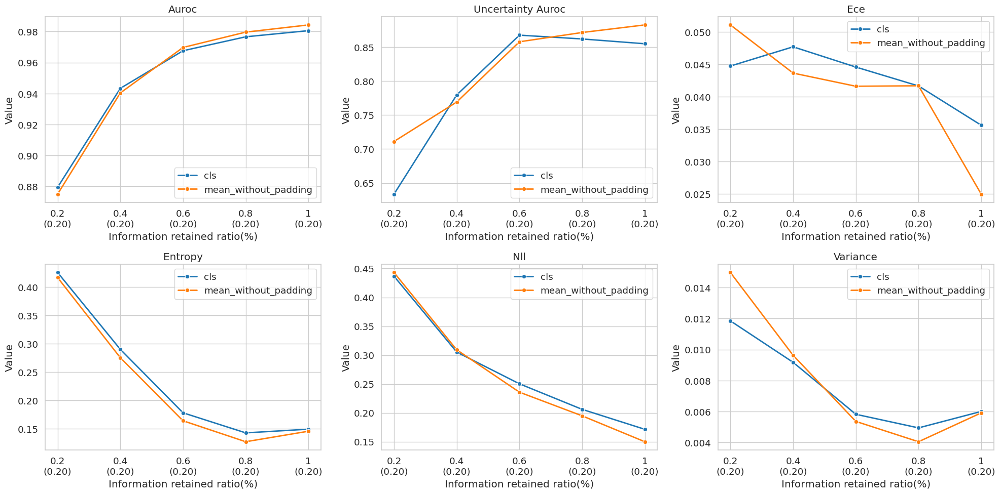

In [4]:
ecg_data,ecg_y,l=ecg_processing()


## Viusal

[0.2, 0.4, 0.6, 0.8, 1.0]
[0.2, 0.4, 0.6, 0.8, 1.0]


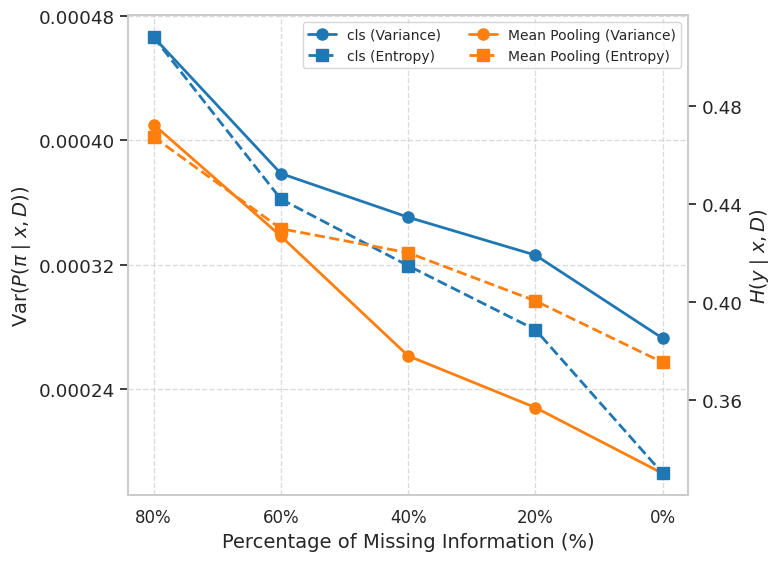

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
from matplotlib.ticker import MaxNLocator
def parse_truncation(trunc_str):
    s = trunc_str.strip()
    if s.startswith("≤"):
        try:
            return float(s.replace("≤", "").strip())
        except:
            return np.nan
    else:
        parts = s.split("-")
        if len(parts) == 2:
            try:
                return float(parts[1].strip())
            except:
                return np.nan
        else:
            try:
                return float(s)
            except:
                return np.nan
def plot_combined_uncertainty(df_dict, dataset_max, selected_datasets=None,save_path=None):
    if selected_datasets is None:
        selected_datasets = list(df_dict.keys())
    sample_ds = selected_datasets[0]
    df_sample = df_dict[sample_ds]
    pooling_methods = df_sample['pooling'].unique()
    palette = sns.color_palette("tab10", n_colors=len(pooling_methods))
    pooling_colors = dict(zip(pooling_methods, palette))
    x_ticks = [0.2, 0.4, 0.6, 0.8,1]
    x_labels = ["0%","20%", "40%", "60%", "80%"]
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax2 = ax1.twinx()
    legend_lines = []
    legend_labels = []
    for ds in selected_datasets:
        df = df_dict[ds].copy()
        df['rel_pct'] = df['truncation']
        for pooling in pooling_methods:
            display_pooling = "Mean Pooling" if pooling == "mean_without_padding" else pooling
            df_pool = df[df['pooling'] == pooling].sort_values(by='rel_pct')
            x_vals = [float(i) for i in df_pool['rel_pct'].values]
            print(x_vals)
            var_vals = df_pool['Variance'].values
            ent_vals = df_pool['Entropy'].values
            if (len(x_vals) != len(x_ticks)) or (not np.allclose(x_vals, x_ticks, atol=0.05)):
                var_interp = np.interp(x_ticks, x_vals, var_vals)
                ent_interp = np.interp(x_ticks, x_vals, ent_vals)
            else:
                var_interp = var_vals
                ent_interp = ent_vals
            line1, = ax1.plot(x_ticks, var_interp, linestyle='-', marker='o',
                              markersize=8, linewidth=2,
                              color=pooling_colors[pooling],
                              label=f"{display_pooling} (Variance)")
            line2, = ax2.plot(x_ticks, ent_interp, linestyle='--', marker='s',
                              markersize=8, linewidth=2,
                              color=pooling_colors[pooling],
                              label=f"{display_pooling} (Entropy)")
            legend_lines.extend([line1, line2])
            legend_labels.extend([f"{display_pooling} (Variance)", f"{display_pooling} (Entropy)"])
    ax1.set_xlabel("Percentage of Missing Information (%)", fontsize=14)
    ax1.set_ylabel(r'$\mathrm{Var}(P(\pi \mid x, D))$', fontsize=14, weight='bold')
    ax2.set_ylabel(r'$H(y \mid x, D)$', fontsize=14, weight='bold')
    ax1.set_xticks(x_ticks)
    ax1.set_xticklabels(x_labels[::-1], fontsize=12)
    ax1.yaxis.set_major_locator(MaxNLocator(5))
    ax2.yaxis.set_major_locator(MaxNLocator(5))
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax2.grid(False)
    ax1.legend(legend_lines, legend_labels, loc="best", fontsize=10, ncol=2, frameon=True)
    plt.subplots_adjust(left=0.15, right=0.85, top=0.95, bottom=0.15)
    if save_path is not None:
        fig.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
df_dict = {
    "Yelp": yelp_data,
    "ECG": ecg_data
}
dataset_max = {
    "IMDB": 230,
    "RCT": 34,
    "Yelp": 95,
    "MIMIC3": 100,
    "Wafer": 152,
    "ECG": 140
}
selected_datasets=[
 "Yelp",
]
plot_combined_uncertainty(df_dict, dataset_max, selected_datasets=selected_datasets,
                          save_path=f"combined_uncertainty_{selected_datasets[0]}.png")


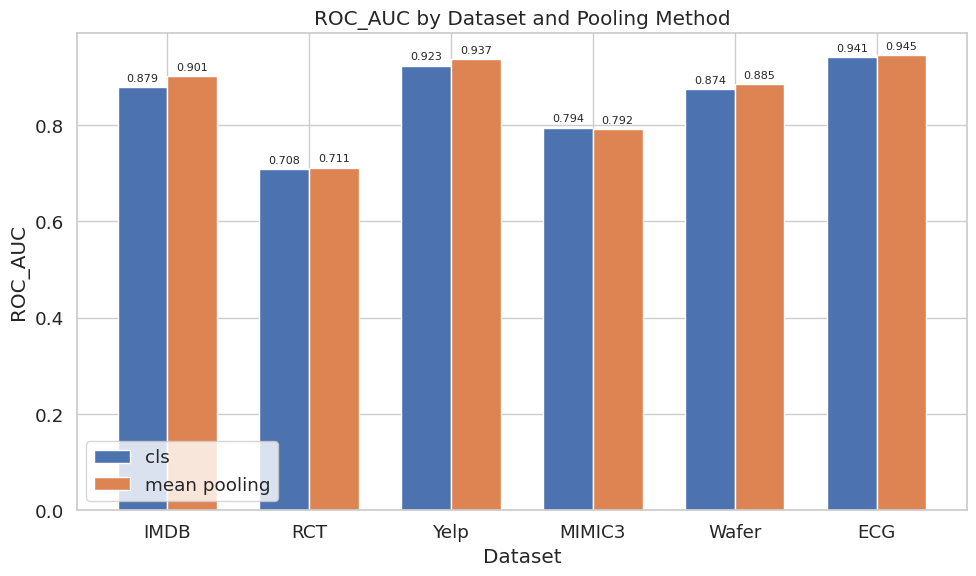

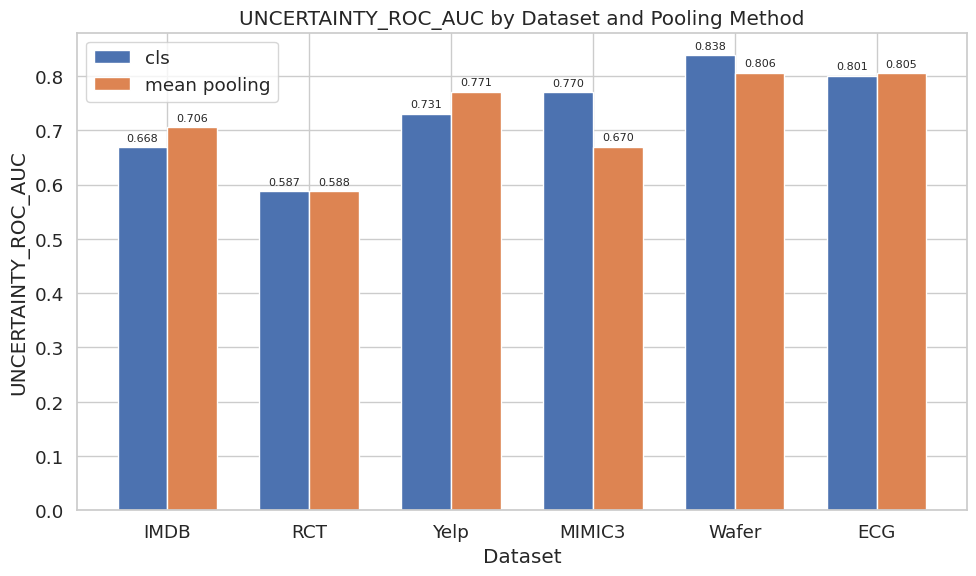

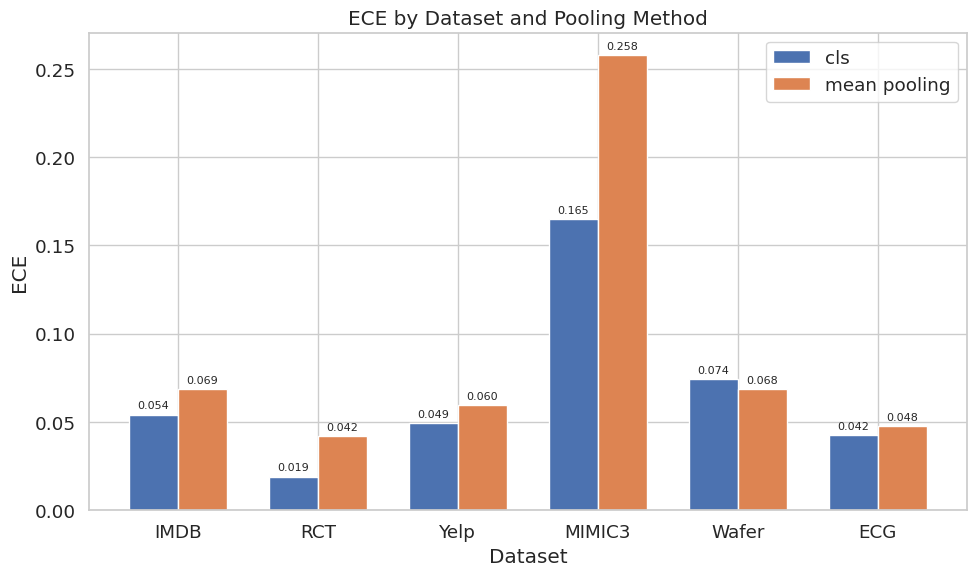

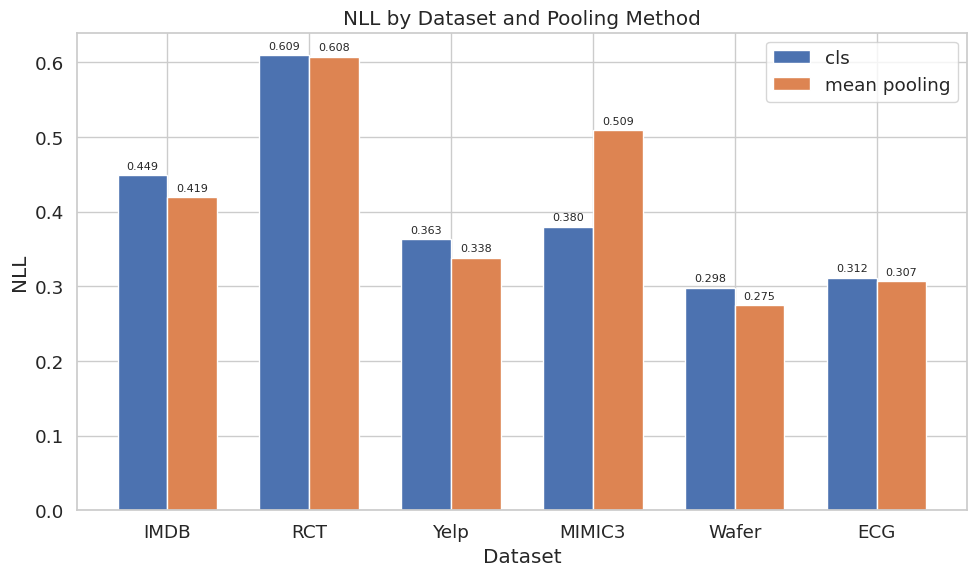

In [22]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import math
def compute_overall_metrics(prob_df, y):
    y = np.array(y)
    prob_df = np.array(prob_df)
    pred = np.mean(prob_df, axis=1)
    var = np.var(prob_df, axis=1)
    roc_auc = roc_auc_score(y, pred)
    correctness = (y == (pred > 0.5))
    fpr, tpr, _ = roc_curve(correctness, -var)
    uncertainty_auc = roc_auc_score(correctness, -var)
    def compute_ece(y_true, y_prob, n_bins=10):
        y_true, y_prob = np.array(y_true), np.array(y_prob)
        bin_edges = np.linspace(0, 1, n_bins + 1)
        ece_val = 0.0
        for i in range(n_bins):
            bin_lower = bin_edges[i]
            bin_upper = bin_edges[i + 1]
            bin_mask = (y_prob > bin_lower) & (y_prob <= bin_upper)
            if np.sum(bin_mask) > 0:
                bin_accuracy = np.mean(y_true[bin_mask] == 1)
                bin_confidence = np.mean(y_prob[bin_mask])
                ece_val += np.abs(bin_accuracy - bin_confidence) * (np.sum(bin_mask) / len(y_true))
        return ece_val
    ece_val = compute_ece(y, pred, n_bins=10)
    epsilon = 1e-10
    nll_val = np.mean(- y * np.log(pred + epsilon) - (1 - y) * np.log(1 - pred + epsilon))
    return {
        "roc_auc": roc_auc,
        "uncertainty_roc_auc": uncertainty_auc,
        "ece": ece_val,
        "nll": nll_val
    }
def compute_overall_metrics_for_dataset(res_set, y):
    poolings = ["cls", "mean_without_padding"]
    results = {}
    for i, pooling in enumerate(poolings):
        results[pooling] = compute_overall_metrics(res_set[i], y)
    return results
def plot_metric_bar_chart(results_dict, metric_name, selected_datasets=None):
    if selected_datasets is None:
        selected_datasets = list(results_dict.keys())
    poolings = ["cls", "mean_without_padding"]
    x = np.arange(len(selected_datasets))
    width = 0.35
    fig, ax = plt.subplots(figsize=(10, 6))
    values_cls = []
    values_mean = []
    for ds in selected_datasets:
        metrics = results_dict[ds]
        values_cls.append(metrics["cls"][metric_name])
        values_mean.append(metrics["mean_without_padding"][metric_name])
    rects1 = ax.bar(x - width/2, values_cls, width, label="cls", color="C0")
    rects2 = ax.bar(x + width/2, values_mean, width, label="mean pooling", color="C1")
    ax.set_xlabel("Dataset")
    ax.set_ylabel(metric_name.upper())
    ax.set_xticks(x)
    ax.set_xticklabels(selected_datasets)
    ax.set_title(f"{metric_name.upper()} by Dataset and Pooling Method")
    ax.legend()
    for rect in rects1 + rects2:
        height = rect.get_height()
        ax.annotate(f"{height:.3f}",
                    xy=(rect.get_x() + rect.get_width()/2, height),
                    xytext=(0, 3), textcoords="offset points",
                    ha="center", va="bottom", fontsize=8)
    plt.tight_layout()
    plt.show()
results_dict = {}
try:
    with open("IMDB/model/ntrain_cls_sq230_imdb_bal.pkl", "rb") as f:
        imdb_cls = pickle.load(f)
    with open("IMDB/model/ntrain_mean_without_padding_sq230_imdb_bal.pkl", "rb") as f:
        imdb_mean = pickle.load(f)
    imdb_res_set = [imdb_cls, imdb_mean]
    results_dict["IMDB"] = compute_overall_metrics_for_dataset(imdb_res_set, imdb_y)
except Exception as e:
    print("IMDB 数据加载错误：", e)
try:
    with open("model/ntrain_cls_sq34_rct_bal.pkl", "rb") as f:
        rct_cls = pickle.load(f)
    with open("model/ntrain_mean_without_padding_sq34_rct_bal.pkl", "rb") as f:
        rct_mean = pickle.load(f)
    rct_res_set = [rct_cls, rct_mean]
    results_dict["RCT"] = compute_overall_metrics_for_dataset(rct_res_set, rct_y)
except Exception as e:
    print("RCT 数据加载错误：", e)
try:
    with open("Yelp/model/ntrain_cls_sq95_yelp_bal.pkl", "rb") as f:
        yelp_cls = pickle.load(f)
    with open("Yelp/model/ntrain_mean_without_padding_sq95_yelp_bal.pkl", "rb") as f:
        yelp_mean = pickle.load(f)
    yelp_res_set = [yelp_cls, yelp_mean]
    results_dict["Yelp"] = compute_overall_metrics_for_dataset(yelp_res_set, yelp_y)
except Exception as e:
    print("Yelp 数据加载错误：", e)
try:
    with open("mimic3/model_result/ensemble_cls_sql100_trun.pkl", "rb") as f:
        mimic3_cls = pickle.load(f)
    with open("mimic3/model_result/ensemble_mean_without_padding_sql100_trun.pkl", "rb") as f:
        mimic3_mean = pickle.load(f)
    mimic3_res_set = [mimic3_cls, mimic3_mean]
    results_dict["MIMIC3"] = compute_overall_metrics_for_dataset(mimic3_res_set, mimic3_y)
except Exception as e:
    print("MIMIC3 数据加载错误：", e)
try:
    with open("Time_series/results/Wafer_ensemble_cls_trun.pkl", "rb") as f:
        wafer_cls = pickle.load(f)
    with open("Time_series/results/Wafer_ensemble_mean_without_padding_trun.pkl", "rb") as f:
        wafer_mean = pickle.load(f)
    wafer_res_set = [pd.DataFrame(wafer_cls).T, pd.DataFrame(wafer_mean).T]
    results_dict["Wafer"] = compute_overall_metrics_for_dataset(wafer_res_set, wafer_y.tolist())
except Exception as e:
    print("Wafer 数据加载错误：", e)
try:
    with open("Time_series/results/ECG200_ensemble_cls_trun.pkl", "rb") as f:
        ecg_cls = pickle.load(f)
    with open("Time_series/results/ECG200_ensemble_mean_without_padding_trun.pkl", "rb") as f:
        ecg_mean = pickle.load(f)
    ecg_res_set = [pd.DataFrame(ecg_cls).T, pd.DataFrame(ecg_mean).T]
    results_dict["ECG"] = compute_overall_metrics_for_dataset(ecg_res_set, ecg_y.tolist())
except Exception as e:
    print("ECG 数据加载错误：", e)
plot_metric_bar_chart(results_dict, metric_name="roc_auc",
                      selected_datasets=["IMDB", "RCT", "Yelp", "MIMIC3", "Wafer", "ECG"])
plot_metric_bar_chart(results_dict, metric_name="uncertainty_roc_auc")
plot_metric_bar_chart(results_dict, metric_name="ece")
plot_metric_bar_chart(results_dict, metric_name="nll")


In [23]:
import pandas as pd
nlp_datasets = ["IMDB", "RCT", "Yelp"]
ehr_datasets = ["MIMIC3", "Wafer", "ECG"]
rows = []
for ds, metrics in results_dict.items():
    if ds in nlp_datasets:
        category = "NLP"
    elif ds in ehr_datasets:
        category = "Time Series"
    else:
        category = "Other"
    row = {
        "Dataset": ds,
        "Category": category,
        "ROC AUC (cls)": metrics["cls"].get("roc_auc", None),
        "ROC AUC (mean)": metrics["mean_without_padding"].get("roc_auc", None),
        "Uncertainty ROC AUC (cls)": metrics["cls"].get("uncertainty_roc_auc", None),
        "Uncertainty ROC AUC (mean)": metrics["mean_without_padding"].get("uncertainty_roc_auc", None),
        "ECE (cls)": metrics["cls"].get("ece", None),
        "ECE (mean)": metrics["mean_without_padding"].get("ece", None),
        "NLL (cls)": metrics["cls"].get("nll", None),
        "NLL (mean)": metrics["mean_without_padding"].get("nll", None)
    }
    rows.append(row)
df_summary = pd.DataFrame(rows)
df_summary = df_summary.sort_values(by=["Category", "Dataset"])
def highlight_metrics(row):
    style = pd.Series("", index=row.index)
    for metric in ["ROC AUC", "Uncertainty ROC AUC"]:
        col_cls = f"{metric} (cls)"
        col_mean = f"{metric} (mean)"
        if pd.notnull(row[col_cls]) and pd.notnull(row[col_mean]):
            if row[col_cls] >= row[col_mean]:
                style[col_cls] = "font-weight: bold"
            else:
                style[col_mean] = "font-weight: bold"
    for metric in ["ECE", "NLL"]:
        col_cls = f"{metric} (cls)"
        col_mean = f"{metric} (mean)"
        if pd.notnull(row[col_cls]) and pd.notnull(row[col_mean]):
            if row[col_cls] <= row[col_mean]:
                style[col_cls] = "font-weight: bold"
            else:
                style[col_mean] = "font-weight: bold"
    return style
styled_df = df_summary.style.apply(highlight_metrics, axis=1)
display(styled_df)


,Dataset,Category,ROC AUC (cls),ROC AUC (mean),Uncertainty ROC AUC (cls),Uncertainty ROC AUC (mean),ECE (cls),ECE (mean),NLL (cls),NLL (mean)
0,IMDB,NLP,0.878860,0.901150,0.668452,0.706356,0.054173,0.068545,0.448583,0.419147
1,RCT,NLP,0.707904,0.710873,0.587418,0.587785,0.019053,0.041844,0.609256,0.607533
2,Yelp,NLP,0.923093,0.936529,0.730832,0.771080,0.049170,0.059622,0.363209,0.338341
5,ECG,Time Series,0.941270,0.944570,0.800861,0.804973,0.042424,0.047701,0.311652,0.306898
3,MIMIC3,Time Series,0.794346,0.791653,0.770162,0.670039,0.164823,0.257660,0.379703,0.508847
4,Wafer,Time Series,0.873642,0.884509,0.838311,0.805942,0.074104,0.068461,0.298062,0.274748
